# Importações e Bibliotecas

In [73]:
import random # Operações de aleatoriedade
import sys # Operações do sistema (print, etc)
import statistics # Operações de estatística

In [74]:
from market import Market, Produto # Importa a classe Market e a classe Produto

In [75]:
# Importações para construção gráfica do melhor indivíduo e do gráfico de evolução
from PIL import Image
from IPython.display import display
import plotly.graph_objects as go

# Valores Estáticos

In [76]:
CART: dict = {
    'Altura': 65,
    'Largura': 50,
    'Comprimento': 80,
    'PesoMaximo': 460*1000
}
CART['Capacidade'] = CART['Altura'] * CART['Largura'] * CART['Comprimento']

CART

{'Altura': 65,
 'Largura': 50,
 'Comprimento': 80,
 'PesoMaximo': 460000,
 'Capacidade': 260000}

In [77]:
MAX_MONEY: float = 1750.0
MAX_ITEMS: int = 100
MAX_CARTS: int = 200
MAX_GENERATIONS: int = 2000
BESTS: int = 5

In [78]:
MED_PRICE: float = MAX_MONEY/MAX_ITEMS
f"Preço Médio por Produto: R${MED_PRICE:.2f}"

'Preço Médio por Produto: R$17.50'

# Funções

In [79]:
m: Market = Market(r"..\data\produtos2.csv")
print(m)

Market Info
7823 products loaded.


In [80]:
def mosaic(cart: list[Produto], row_quantity: int = 5, image_size: tuple[int, int] = (300, 300)) -> None:
    """Cria um mosaico com as imagens dos produtos do carrinho"""
    
    # Lista o objeto das imagens
    images: list[Image] = [product.show(popup=False).resize(image_size) for product in cart]
    
    # Calcula o tamanho do mosaico
    mosaic_size: tuple[int, int] = (image_size[0]*row_quantity, image_size[1]*((len(images)//row_quantity)+1))
    
    # Cria a imagem do mosaico
    mosaic: Image = Image.new('RGB', mosaic_size)
    
    # Coloca as imagens no mosaico
    for i, image in enumerate(images):
        mosaic.paste(image, (image_size[0]*(i%row_quantity), image_size[1]*(i//row_quantity)))
    
    # Exibe o mosaico
    display(mosaic) 

In [81]:
def plot_generations(data: dict[int, dict[str, float]]) -> None:
    """Plota um gráfico com os valores de cada geração"""
    
    # Extrai as iterações e os valores
    iterations: list = list(data.keys())
    max_values: list = [data[i]['max'] for i in iterations]
    min_values: list = [data[i]['min'] for i in iterations]
    avg_values: list = [data[i]['med'] for i in iterations]

    # Cria o objeto gráfico
    fig = go.Figure()

    # Adiciona as linhas para cada variável
    fig.add_trace(go.Scatter(x=iterations, y=max_values, mode='lines+markers', name='Max', line=dict(color="#a90000")))
    fig.add_trace(go.Scatter(x=iterations, y=min_values, mode='lines+markers', name='Min', line=dict(color="#007d1d")))
    fig.add_trace(go.Scatter(x=iterations, y=avg_values, mode='lines+markers', name='Medio', line=dict(color="#356fa8")))

    # Adiciona título e rótulos
    fig.update_layout(
                    title='Gráfico de Gerações',
                    xaxis_title='Iteração',
                    yaxis_title='Valores',
                    yaxis_type='log',  #! Define o eixo y como logarítmico
                    template='plotly'
                )

    # Exibe o gráfico
    fig.show()

In [82]:
def calculate_regression(data: dict, last: int = globals()['MAX_GENERATIONS']//5) -> float:
    """ Calcula a regressão linear dos valores de uma lista de gerações das últimas N gerações """
    
    # Se a quantidade de dados for menor que o mínimo, retorna infinito
    if len(data) < last:
        return float("inf")
    
    else:
        values: list = list(data.values())[-last:]
        return statistics.stdev([value.get('min') for value in values])

In [83]:
def instanciate(cart: list[int]) -> list[Produto]:
    """Instancia uma lista de produtos a partir de uma lista de IDs"""
    
    return [m.get(i) for i in cart]

In [84]:
def info(cart: list[int]) -> str:
    """ Retorna uma string com as informações do indivíduo/carrinho """
    nota: float = avaliar(cart)
    cart: list[Produto] = instanciate(cart)
    return f"[INDIVÍDUO]\n\
Nota: {nota}\n\
Tamanho: {len(cart)}\n\n\
[INFORMAÇÕES DO CARRINHO]\n\
Preço Total: R${sum([product.price for product in cart]):.2f}\n\
Peso Total: {sum([product.weight for product in cart])/1000:.2f}g\n\
Volume Total: {sum([product.volume for product in cart]):.2f}cm³\n\
Preço médio: R${sum([product.price for product in cart])/len(cart)}\n\n\
[PRODUTOS]\n\
Menor preço: R${min([product.price for product in cart])}\n\
Maior preço: R${max([product.price for product in cart])}\n\
Menor peso: {min([product.weight for product in cart])}g\n\
Maior peso: {max([product.weight for product in cart])}g\n\
Menor volume: {min([product.volume for product in cart])}cm³\n\
Maior volume: {max([product.volume for product in cart])}cm³\n\n\
[CATEGORIAS]:\n{"\n".join([f"- {category}: {[product.category for product in cart].count(category)}" for category in set([product.category for product in cart])])}\n\n\
[LISTAGEM]\n{"\n".join([f"{product.name} \t R${product.price:.2f} \t {product.weight:.2f}g \t {product.volume:.2f}cm³" for product in cart])}\n\
"

# Genético

### Geração de Indivíduos

In [85]:
def gerar_carrinho(tamanho: int = globals()['MAX_ITEMS']) -> list[int]:
    compra = []

    while len(compra) < tamanho:
        item: int = m.random()
        compra.append(item)
        
    return compra

In [86]:
c: list[int] = gerar_carrinho()
c

[444517,
 715821,
 314065,
 1458740,
 1616340,
 463522,
 1600699,
 466057,
 588921,
 29311,
 472430,
 1602852,
 400352,
 310568,
 659743,
 1326620,
 1440302,
 159684,
 396039,
 466640,
 1614248,
 59364,
 595624,
 1616537,
 458054,
 176513,
 64940,
 614587,
 690955,
 409528,
 433400,
 459933,
 691458,
 469518,
 66655,
 468068,
 1340719,
 538524,
 1944,
 804252,
 1602159,
 472453,
 169573,
 145075,
 53630,
 466102,
 335989,
 190728,
 446352,
 1572797,
 1613340,
 64442,
 1624289,
 64382,
 456107,
 412866,
 1615441,
 74296,
 140452,
 277504,
 10925,
 1614255,
 472096,
 176582,
 1588958,
 1440313,
 242527,
 96234,
 345216,
 170820,
 1520519,
 697105,
 1435288,
 64609,
 427111,
 393971,
 1619139,
 247105,
 1568681,
 1616532,
 678401,
 804257,
 1373090,
 321199,
 687151,
 1614047,
 462509,
 153258,
 41871,
 135310,
 56561,
 469995,
 334181,
 168448,
 1404201,
 50532,
 1386874,
 430003,
 1105284,
 1101274]

### Geração de População Inicial

In [87]:
def gerar_populacao(tamanho: int = globals()['MAX_CARTS']) -> list[list[int]]:
    return [gerar_carrinho() for _ in range(tamanho)]

In [88]:
p: list[list[int]] = gerar_populacao()
p

[[392023,
  117463,
  1616615,
  406015,
  512749,
  449554,
  381810,
  1446440,
  1615235,
  1539003,
  108149,
  100705,
  381471,
  458825,
  479389,
  642797,
  198094,
  440670,
  1495617,
  450185,
  1616672,
  13905,
  753054,
  334388,
  1615426,
  343834,
  320209,
  1624217,
  180902,
  1107472,
  133072,
  1468916,
  1568079,
  66222,
  92369,
  400341,
  330293,
  1616841,
  433165,
  302930,
  396157,
  1614225,
  55672,
  441872,
  443560,
  460529,
  57876,
  476526,
  709889,
  452448,
  347965,
  642797,
  308147,
  1539151,
  142766,
  1450068,
  396845,
  8234,
  446655,
  132614,
  1625178,
  386729,
  463524,
  1607300,
  156289,
  115217,
  1616323,
  1433058,
  477927,
  457820,
  119134,
  512739,
  214102,
  293658,
  478011,
  623679,
  595336,
  1615115,
  1624130,
  1613940,
  454949,
  459740,
  1446424,
  279928,
  1618972,
  36522,
  52145,
  408887,
  443369,
  466628,
  479470,
  1108003,
  553390,
  141779,
  60004,
  119322,
  1624415,
  430263,
  16

### Avaliação

In [ ]:
def avaliar(individuo: list[int]) -> float:
    valor_total: float = 0.0
    peso_total: float = 0.0
    volume_total: float = 0.0
    repeticoes: int = 0
    categorias: list = []
    
    pesos = {
        'essencial': 0.9,
        'alimentos': 0.85,
        'açougue': 0.9,
        'beleza-e-perfumaria': 0.55,
        'bebidas': 0.6, 
        'bebidas-alcoolicas': 0.3,
        'limpeza': 0.4,
        'cuidados-pessoais': 0.55 
    }
    
    for id in individuo:
        produto = m.get(id)
        volume_total+=produto.volume
        peso_total+=produto.weight
        valor_total+=produto.price
        categorias.append(produto.category)
        r=individuo.count(id)
        repeticoes+=(r*2) if r > 1 else 0
        
    # nota = valor_total**2
    # nota = globals()['MAX_MONEY']
    nota = 100
    
    # Ônus
    nota*= max(1, volume_total - globals()['CART']['Capacidade'])
    nota*= max(1, peso_total - globals()['CART']['PesoMaximo'])
    nota*= max(1, valor_total - globals()['MAX_MONEY'])
    nota*= max(1, repeticoes)

    # Bônus
    nota/= len(set(categorias))
    nota*= sum([pesos[c]**categorias.count(c) for c in set(categorias)])
    

    return nota**2 


In [90]:
n: float = avaliar(c)
n

137585.19786336343

In [91]:
def mapear_notas(populacao: list[list[int]], order: str = 'asc') -> dict[float, list[int]]:
    notas: dict = {avaliar(individuo): individuo for individuo in populacao}
    
    if order == 'asc':
        return dict(sorted(notas.items()))
    
    else:
        return dict(sorted(notas.items(), reverse=True))

In [92]:
nt: dict[float, list[int]] = mapear_notas(p)
nt

{0.0689855703259813: [457343,
  89239,
  8234,
  142853,
  1491202,
  169950,
  387729,
  23097,
  485191,
  1572741,
  1568237,
  333375,
  615922,
  402520,
  710296,
  468389,
  1614048,
  1618694,
  64656,
  396157,
  1598128,
  547126,
  290042,
  433239,
  382150,
  415724,
  223171,
  1623323,
  1529604,
  1446440,
  709893,
  623696,
  1616615,
  447138,
  1619386,
  349742,
  271506,
  457918,
  6039,
  327164,
  440204,
  342349,
  463523,
  269471,
  584604,
  1575081,
  315957,
  1496555,
  457499,
  456598,
  158955,
  1609483,
  803843,
  1614043,
  428829,
  438271,
  1602166,
  348305,
  538581,
  1387085,
  462226,
  1614057,
  321743,
  225177,
  269827,
  528838,
  1618769,
  1446461,
  1619292,
  438484,
  431811,
  478051,
  1623328,
  384523,
  537882,
  293850,
  1497216,
  1614786,
  1616323,
  1059418,
  395828,
  306808,
  13905,
  346183,
  431983,
  185677,
  105092,
  460411,
  472637,
  670161,
  341414,
  97608,
  1435291,
  539627,
  1623327,
  1616765,


### Seleção

In [93]:
def torneio(populacao: list[list[int]]) -> list[list[int]]:
    vencedores: list[list[int] | None] = []
    
    while len(vencedores) < 2:
        competidores: list[list[int]] = random.sample(populacao, 2)
        
        if avaliar(competidores[0]) < avaliar(competidores[1]):
            vencedor: list[int] = competidores[0]
        
        else:
            vencedor: list[int] = competidores[1]             

        if vencedor not in vencedores:    
            vencedores.append(vencedor)
    
    return vencedores

In [94]:
v1: list[list[int]] = torneio(p)
v1

[[697105,
  475461,
  428318,
  328381,
  678412,
  468125,
  450085,
  538580,
  52120,
  1468858,
  35639,
  412723,
  332651,
  1124390,
  342435,
  401851,
  472661,
  642612,
  344687,
  1615273,
  89337,
  658759,
  174565,
  107047,
  165494,
  168873,
  1616044,
  1243542,
  179515,
  1617262,
  459933,
  1614043,
  433164,
  1440347,
  21514,
  201849,
  708584,
  547126,
  1386034,
  48266,
  441614,
  460415,
  402519,
  99446,
  1616374,
  439799,
  410953,
  345211,
  125781,
  331251,
  270364,
  654563,
  753054,
  1609281,
  1614950,
  1616643,
  659739,
  1624085,
  400353,
  435291,
  326560,
  1105261,
  143315,
  456128,
  115552,
  430082,
  1570317,
  1619272,
  349742,
  348771,
  1517677,
  162207,
  305906,
  1539001,
  1619278,
  1619146,
  1578860,
  1602739,
  564771,
  1624025,
  686888,
  144602,
  381470,
  475326,
  1623199,
  465036,
  452602,
  1624415,
  179791,
  711843,
  60343,
  326722,
  326648,
  101043,
  443028,
  11428,
  172102,
  412860,
  

In [95]:
def roleta_viciada(populacao: list[list[int]]) -> list[list[int]]:
    fitness_list: list[float] = [1 / avaliar(individuo) for individuo in populacao]
    total_fitness: float = sum(fitness_list)
    probabilities: list[float] = [fitness / total_fitness for fitness in fitness_list]
    
    vencedores: list[list[int]] = random.choices(populacao, weights=probabilities, k=2)
    
    return vencedores

In [96]:
v2: list[list[int]] = roleta_viciada(p)
v2

[[457343,
  89239,
  8234,
  142853,
  1491202,
  169950,
  387729,
  23097,
  485191,
  1572741,
  1568237,
  333375,
  615922,
  402520,
  710296,
  468389,
  1614048,
  1618694,
  64656,
  396157,
  1598128,
  547126,
  290042,
  433239,
  382150,
  415724,
  223171,
  1623323,
  1529604,
  1446440,
  709893,
  623696,
  1616615,
  447138,
  1619386,
  349742,
  271506,
  457918,
  6039,
  327164,
  440204,
  342349,
  463523,
  269471,
  584604,
  1575081,
  315957,
  1496555,
  457499,
  456598,
  158955,
  1609483,
  803843,
  1614043,
  428829,
  438271,
  1602166,
  348305,
  538581,
  1387085,
  462226,
  1614057,
  321743,
  225177,
  269827,
  528838,
  1618769,
  1446461,
  1619292,
  438484,
  431811,
  478051,
  1623328,
  384523,
  537882,
  293850,
  1497216,
  1614786,
  1616323,
  1059418,
  395828,
  306808,
  13905,
  346183,
  431983,
  185677,
  105092,
  460411,
  472637,
  670161,
  341414,
  97608,
  1435291,
  539627,
  1623327,
  1616765,
  346272,
  47399,
 

In [97]:
def eugenia(populacao: list[list[int]], order: str = 'asc') -> list[list[int]]:
    notas: dict[float, list[int]] = mapear_notas(populacao, order)
    melhores: list[list[int]] = list(notas.values())[:globals()['BESTS']]
    
    return melhores

In [98]:
e: list[list[int]] = eugenia(p)
e

[[457343,
  89239,
  8234,
  142853,
  1491202,
  169950,
  387729,
  23097,
  485191,
  1572741,
  1568237,
  333375,
  615922,
  402520,
  710296,
  468389,
  1614048,
  1618694,
  64656,
  396157,
  1598128,
  547126,
  290042,
  433239,
  382150,
  415724,
  223171,
  1623323,
  1529604,
  1446440,
  709893,
  623696,
  1616615,
  447138,
  1619386,
  349742,
  271506,
  457918,
  6039,
  327164,
  440204,
  342349,
  463523,
  269471,
  584604,
  1575081,
  315957,
  1496555,
  457499,
  456598,
  158955,
  1609483,
  803843,
  1614043,
  428829,
  438271,
  1602166,
  348305,
  538581,
  1387085,
  462226,
  1614057,
  321743,
  225177,
  269827,
  528838,
  1618769,
  1446461,
  1619292,
  438484,
  431811,
  478051,
  1623328,
  384523,
  537882,
  293850,
  1497216,
  1614786,
  1616323,
  1059418,
  395828,
  306808,
  13905,
  346183,
  431983,
  185677,
  105092,
  460411,
  472637,
  670161,
  341414,
  97608,
  1435291,
  539627,
  1623327,
  1616765,
  346272,
  47399,
 

### Crossover e Mutação

In [99]:
def cruzamento(pais: list[list[int]], chance: float = 0.80, num_pontos_corte: int = 3) -> list[list[int]]:
    pai_1: list[int] = pais[0]
    pai_2: list[int] = pais[1]

    probabilidade: float = round(random.uniform(0, 1), 2)
    if probabilidade < chance:
        pontos_corte: list[int] = sorted(random.sample(range(1, len(pai_1)), num_pontos_corte))

        filho_1: list[int | None] = []
        filho_2: list[int | None] = []

        pos_inicio: int = 0
        for i in range(num_pontos_corte):
            pos_fim = pontos_corte[i]
            filho_1 += pai_1[pos_inicio:pos_fim] if i % 2 == 0 else pai_2[pos_inicio:pos_fim]
            filho_2 += pai_2[pos_inicio:pos_fim] if i % 2 == 0 else pai_1[pos_inicio:pos_fim]
            pos_inicio = pos_fim

        # Adicionando a parte restante do genoma após o último ponto de corte
        filho_1 += pai_2[pos_inicio:]
        filho_2 += pai_1[pos_inicio:]

        return [filho_1, filho_2]

    else:
        return [pai_1, pai_2]

In [100]:
f: list[list[int]] = cruzamento(v1)
f

[[697105,
  475461,
  428318,
  328381,
  678412,
  468125,
  450085,
  538580,
  52120,
  1468858,
  35639,
  412723,
  332651,
  1124390,
  342435,
  401851,
  472661,
  642612,
  344687,
  1615273,
  89337,
  658759,
  174565,
  107047,
  165494,
  168873,
  1616044,
  1243542,
  179515,
  1617262,
  459933,
  1614043,
  433164,
  1440347,
  21514,
  201849,
  708584,
  547126,
  1386034,
  48266,
  441614,
  460415,
  402519,
  99446,
  1616374,
  439799,
  410953,
  345211,
  125781,
  331251,
  270364,
  654563,
  419635,
  98491,
  433488,
  138346,
  29078,
  1376289,
  1574786,
  1433060,
  324895,
  1619070,
  81206,
  1568062,
  115552,
  430082,
  1570317,
  1619272,
  349742,
  348771,
  1517677,
  162207,
  305906,
  1539001,
  1619278,
  1619146,
  1578860,
  1602739,
  564771,
  1624025,
  686888,
  144602,
  381470,
  475326,
  1623199,
  1567260,
  695154,
  394213,
  411662,
  466562,
  328080,
  54650,
  144602,
  410729,
  796012,
  479470,
  444704,
  642765,
  12

In [101]:
def mutar(populacao: list[list[int]], chance = 0.03) -> list[list[int]]: 
    mutados: list[list[int]] = []

    for individuo in populacao:
        for pos, alelo in enumerate(individuo):
            mutacao: float = round(random.uniform(0, 1), 3)

            if mutacao < chance:
                novo_gene: str = m.random(ignore_case=[alelo,]) 
                individuo: str = individuo[:pos] + [novo_gene] + individuo[pos+1:]

        mutados.append(individuo)
    
    return mutados

In [102]:
mt: list[list[Produto]] = mutar(f)
mt

[[697105,
  475461,
  428318,
  328381,
  678412,
  468125,
  450085,
  538580,
  52120,
  1468858,
  41609,
  412723,
  332651,
  1124390,
  342435,
  401851,
  472661,
  642612,
  344687,
  1615273,
  89337,
  658759,
  174565,
  107047,
  165494,
  168873,
  1616044,
  412733,
  179515,
  1617262,
  459933,
  1614043,
  433164,
  1440347,
  21514,
  201849,
  708584,
  547126,
  1386034,
  48266,
  441614,
  460415,
  402519,
  99446,
  1616374,
  439799,
  410953,
  345211,
  125781,
  331251,
  270364,
  654563,
  419635,
  98491,
  433488,
  138346,
  29078,
  1376289,
  1574786,
  1433060,
  324895,
  1619070,
  81206,
  1568062,
  115552,
  430082,
  1570317,
  1619272,
  349742,
  348771,
  1517677,
  162207,
  305906,
  1539001,
  1619278,
  1619146,
  1578860,
  1602739,
  564771,
  1624025,
  686888,
  144602,
  381470,
  475326,
  1623199,
  1567260,
  695154,
  394213,
  411662,
  466562,
  328080,
  54650,
  144602,
  410729,
  796012,
  479470,
  444704,
  642765,
  128

# Execução Principal

In [103]:
relatorio: dict[dict[str: float]] = {}

In [104]:
if __name__ == '__main__':
    i: int = 1
    populacao_atual: list[list[int]] = gerar_populacao()
    notas: list[float | None] = list(mapear_notas(populacao_atual).keys())
    
    while (i <= MAX_GENERATIONS) and (calculate_regression(relatorio) >= 1) and (0 not in notas):
        geracao: list[list[int]] = []
        
        while len(geracao) < (MAX_CARTS - BESTS):
            pais: list[list[int]] = torneio(populacao_atual)
            # pais: list[list[int]] = roleta_viciada(populacao_atual)
            
            filhos: list[list[int]] = mutar(cruzamento(pais))
            geracao.extend(filhos)
            
        geracao.extend(eugenia(populacao_atual))
        
        populacao_atual: list[list[int]] = geracao.copy()
        notas: list[float] = list(mapear_notas(populacao_atual).keys())
        relatorio[i] = {'max': max(notas), 'min': min(notas), 'med': statistics.median(notas)}
        sys.stdout.write(f'\rGeração: {i}\n')
        i+=1

Geração: 1
Geração: 2
Geração: 3
Geração: 4
Geração: 5
Geração: 6
Geração: 7
Geração: 8
Geração: 9
Geração: 10
Geração: 11
Geração: 12
Geração: 13
Geração: 14
Geração: 15
Geração: 16
Geração: 17
Geração: 18
Geração: 19
Geração: 20
Geração: 21
Geração: 22
Geração: 23
Geração: 24
Geração: 25
Geração: 26
Geração: 27
Geração: 28
Geração: 29
Geração: 30
Geração: 31
Geração: 32
Geração: 33
Geração: 34
Geração: 35
Geração: 36
Geração: 37
Geração: 38
Geração: 39
Geração: 40
Geração: 41
Geração: 42
Geração: 43
Geração: 44
Geração: 45
Geração: 46
Geração: 47
Geração: 48
Geração: 49
Geração: 50
Geração: 51
Geração: 52
Geração: 53
Geração: 54
Geração: 55
Geração: 56
Geração: 57
Geração: 58
Geração: 59
Geração: 60
Geração: 61
Geração: 62
Geração: 63
Geração: 64
Geração: 65
Geração: 66
Geração: 67
Geração: 68
Geração: 69
Geração: 70
Geração: 71
Geração: 72
Geração: 73
Geração: 74
Geração: 75
Geração: 76
Geração: 77
Geração: 78
Geração: 79
Geração: 80
Geração: 81
Geração: 82
Geração: 83
Geração: 84
G

In [105]:
for gen, data in relatorio.items():
    print(f'Geração: {gen} - {data}')

Geração: 1 - {'max': 3.733569509095756e+22, 'min': 0.011036026443293621, 'med': 1209664.8167483378}
Geração: 2 - {'max': 151577042381.28134, 'min': 0.00859178225011493, 'med': 117674.71245551332}
Geração: 3 - {'max': 2.7266083033547624e+16, 'min': 0.00047068065144428145, 'med': 36433.08134303855}
Geração: 4 - {'max': 1.0897954336937494e+17, 'min': 0.00047068065144428145, 'med': 8133.297303411947}
Geração: 5 - {'max': 3.567834365402066e+16, 'min': 0.00047068065144428145, 'med': 1947.087611679607}
Geração: 6 - {'max': 1.4112089758210123e+17, 'min': 0.00047068065144428145, 'med': 537.2725122378073}
Geração: 7 - {'max': 4497201165.41018, 'min': 0.00047068065144428145, 'med': 162.58435325910688}
Geração: 8 - {'max': 491421808600.10284, 'min': 0.00047068065144428145, 'med': 7.188445020592987}
Geração: 9 - {'max': 41218630062.522095, 'min': 0.00028163523306301596, 'med': 1.1367563119284618}
Geração: 10 - {'max': 4.566741397381804e+16, 'min': 0.00028163523306301596, 'med': 0.21622912516012838}

In [106]:
plot_generations(relatorio)

In [107]:
best_individual: list[int] = eugenia(populacao_atual)[0]
best_cart: list[Produto] = instanciate(best_individual)

print(f"Última Geração: {i}\n\n", info(best_individual))

Última Geração: 401

 [INDIVÍDUO]
Nota: 0.0002225797539017296
Tamanho: 100

[INFORMAÇÕES DO CARRINHO]
Preço Total: R$1676.19
Peso Total: 68.47g
Volume Total: 118001.88cm³
Preço médio: R$16.7619

[PRODUTOS]
Menor preço: R$1.89
Maior preço: R$79.9
Menor peso: 0.708g
Maior peso: 18000.0g
Menor volume: 49.192cm³
Maior volume: 8755.199999999999cm³

[CATEGORIAS]:
- cuidados-pessoais: 15
- bebidas-alcoolicas: 8
- bebidas: 18
- limpeza: 11
- alimentos: 48

[LISTAGEM]
Salgadinho Dinamita Flamin Hot Doritos 60G 	 R$4.99 	 62.78g 	 6732.00cm³
Creme de Leite SHEFA Caixa 200ml 	 R$4.19 	 211.00g 	 192.28cm³
Suco VILLA PIVA Integral de Maçã 1 litro 	 R$22.49 	 1481.00g 	 2025.00cm³
Polpa de Fruta Cajá Qualitá Pacote 100g 	 R$2.79 	 120.00g 	 157.50cm³
Espumante Brasileiro Branco Brut Fausto Serra Gaúcha Garrafa 750ml 	 R$69.99 	 1637.00g 	 2776.19cm³
Amaciante VIDA MACIA Baby Camomila 1 Litro 	 R$12.49 	 1057.00g 	 2171.70cm³
Lava-Roupas Líquido Concentrado Ariel Expert Frasco 2l 	 R$49.99 	 2242.00

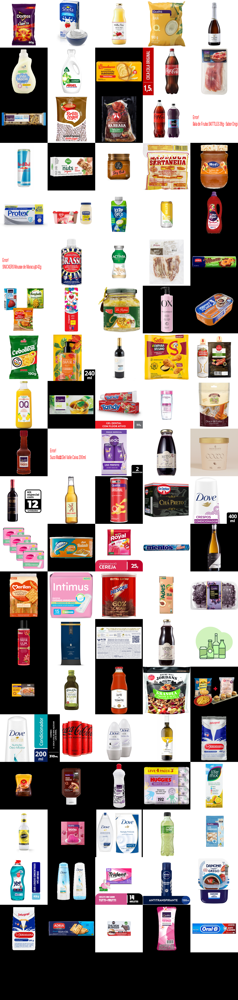

In [108]:
mosaic(best_cart)